# Diffusion Models with Live Code

<div class="nav-links">
  <a href="../intro.html">About Me</a>
  <a href="../publications.html">Publications</a>
  <a href="../intro.html#my-teaching">My Teaching</a>
  <a href="../research_notes/intro.html">Research Notes</a>
</div>

---

```{admonition} Details about this article
:class: note, dropdown

In this article, we will refresh the most fundamental definitions, principles and theorems that will help us understand and appreciate diffusion models.

The contents of this page are intentionally dense to provide a comprehensive refresher of these fundamental concepts.

Use {fa}`rocket` (top right of this page) --> {guilabel}`Live Code` option on this page to play with python code right from the browser.
```

## What is a function?

::::{admonition} This title will not be shown
:class: lightanddark, no-title
"In mathematics, a function from a set $X$ to a set $Y$ assigns to each element of $X$ exactly one element of $Y$." - _Wikipedia_.

In simpler words, a function is something that takes an input and produces only one possible output for that given input.
::::

Generally, a function is represented is using $f(\cdot)$, and a function that maps from a point $x \in X$ to $y \in Y$ is represented as:

$$
y = f(x)
$$

A function can be represented in multiple ways:

```{figure} https://www.aplustopper.com/media/images/articles/What-is-a-Function-1.jpg
---
width: 70%
name: functions-venn
align: center
---
Functions represented using Venn diagrams
```

```{figure} https://cdn-academy.pressidium.com/academy/wp-content/uploads/2021/01/graphs-2-1024x397.png
---
width: 70%
name: functions-graph
align: center
---
Functions as a graph (This is the most common representation).
```

### Why do we need functions?

```{admonition} Why functions?
:class: tip

For a data point $x \in X$, if there is a function that maps from $X$ to $Y$, we can use the function $y = f(x)$ to estimate the values of $x$ over real-line where true values are unknown.
```

The above reason, introduces two concepts:

1. Knowing the function mapping from $X$ to $Y$
2. Estimating the value of $y$ at any $x$

Once you know (or have a good estimation of the function $f(x)$, finding $y$ at an $x$ is very simple). Finding the function $f(x)$ is what is the toughest part.

### Question 1: Given a bunch of data points $(x, y)$, how can we estimate the function $y = f(x)$ ? 

Given a bunch of data points from a **linear** function, let's see how we can estimate an _unknown function_ $f(x)$. In this exercise, we will also understand the effect of the data size on our estimation.


In [55]:
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display
from scipy.stats import norm

# Function to generate data with unknown slope and intercept
def get_data(n_points=100):
    true_slope = 2.5
    true_intercept = -1.0
    x_data = np.linspace(0, 10, n_points)
    y_data = true_slope * x_data + true_intercept + np.random.normal(0, 3, n_points)  # Adding some noise
    return x_data, y_data, (true_slope, true_intercept)

# Unified function to handle both slider-based and static plotting
def plot_estimation(n_points=100, slider=False, estimated_function=None):
    if slider:
        # Create a slider for interactive control
        slider_widget = widgets.IntSlider(value=n_points, min=10, max=500, step=10, description="n_points")
        return widgets.interactive(lambda n: plot_estimation(n, slider=False, estimated_function=estimated_function), 
                                   n=slider_widget)
    
    # Ensure estimated_function is provided
    if estimated_function is None:
        raise ValueError("You must provide an estimated_function to fit the data.")

    # Generate data and estimate the line
    x_data, y_data, (true_slope, true_intercept) = get_data(n_points)
    estimated_slope, estimated_intercept = estimated_function(x_data, y_data)

    # Prepare plotting values
    x_fit = np.linspace(0, 10, n_points)
    y_true = true_slope * x_fit + true_intercept
    y_estimated = estimated_slope * x_fit + estimated_intercept

    # Plot
    plt.figure(figsize=(8,5))
    plt.scatter(x_data, y_data, color='red', label='Data Points', alpha=0.6)
    plt.plot(x_fit, y_true, 'g--', label='True Line')
    plt.plot(x_fit, y_estimated, 'b-', label='Estimated Line')
    plt.xlabel("x")
    plt.ylabel("y")
    plt.legend()
    plt.title(f"True vs Estimated Line (n_points={n_points})\n"
              f"True Slope: {true_slope:.2f}, Estimated Slope: {estimated_slope:.2f}\n"
              f"True Intercept: {true_intercept:.2f}, Estimated Intercept: {estimated_intercept:.2f}")
    plt.show()

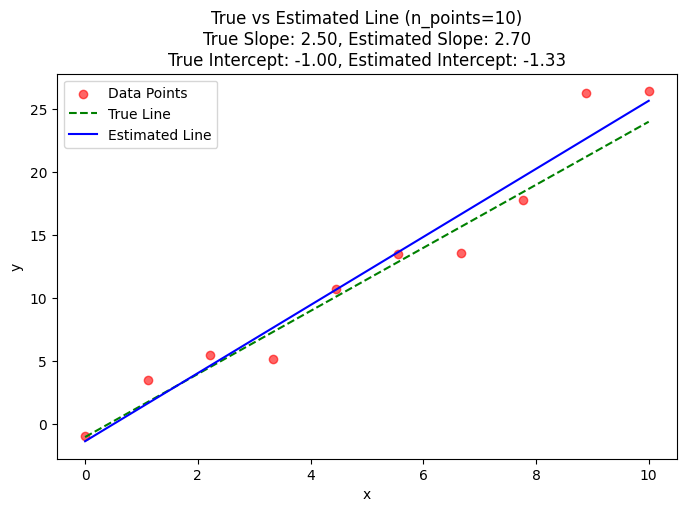

In [ ]:
# Function to estimate slope and intercept
def estimated_function(x_data, y_data):
    estimated_slope, estimated_intercept = np.polyfit(x_data, y_data, 1)
    return estimated_slope, estimated_intercept

plot_estimation(n_points=10, slider=True, estimated_function=estimated_function)

From the above plot, we see as the number of data points increases, our estimation of the slope and y-intercept gets better and better.

Estimating non-linear functions when given a bunch of data points $(x, y)$ is a whole another course in itself (hint: Machine Learning). 

For the scope of this lecture, we will stick to a very simple idea of **Neural Networks as function approximators**.

### Neural Networks as function approximators

In simple terms, neural networks take data points ${x_i, x_j ... }$ (as tensors) as input, and _learn_ to predict the corresponding labels ${y_i, y_j, ... }$. There are two components in a neural network:

1. Feature extractor module
2. Task specific head

For a quick example, we can take a look at [tensorflow playground](https://playground.tensorflow.org/#activation=tanh&batchSize=10&dataset=circle&regDataset=reg-plane&learningRate=0.03&regularizationRate=0&noise=0&networkShape=4,2&seed=0.75860&showTestData=false&discretize=false&percTrainData=50&x=true&y=true&xTimesY=false&xSquared=false&ySquared=false&cosX=false&sinX=false&cosY=false&sinY=false&collectStats=false&problem=classification&initZero=false&hideText=false). This website helps us understand the importance of feature extraction, and classification.

A simple representation of a neural network:


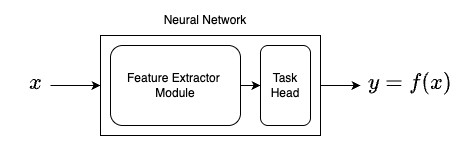

In [2]:
from IPython.display import Markdown, display

with open("../figures/nn.txt", "r") as file:
    base64_image = file.read().strip()

markdown_code = f'<img src="{base64_image}" style="max-width:100%;" />'
display(Markdown(markdown_code))

```{admonition} What are Neural Networks to us?
:class: tip
For the scope of this lecture, we will stop our discussion on Neural Networks here. We acknowledge that neural networks are great function approximation models, and depending on the task, they can be used for classification, detection and so on.
```

## What is a Probability Distribution?

```{admonition} Probability Distribution $p(x)$
:class: note

A probability distribution is a function that assigns probabilities to different values of a random variable.

```

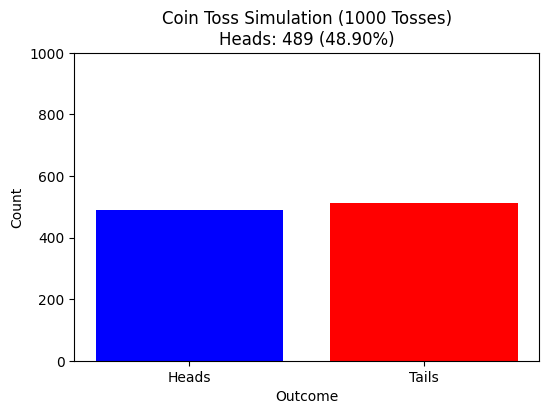

In [ ]:
# Function to simulate tossing a fair coin
def simulate_coin_tosses(n_experiments=1000):
    results = np.random.choice([0, 1], size=n_experiments)  # 0 = Tails, 1 = Heads
    heads_count = np.sum(results)  # Count number of heads
    proportion_heads = heads_count / n_experiments  # Proportion of heads

    # Plot distribution
    plt.figure(figsize=(6, 4))
    plt.bar(['Heads', 'Tails'], [heads_count, n_experiments - heads_count], color=['blue', 'red'])
    plt.xlabel("Outcome")
    plt.ylabel("Count")
    plt.title(f"Coin Toss Simulation ({n_experiments} Tosses)\nHeads: {heads_count} ({proportion_heads:.2%})")
    plt.ylim(0, n_experiments)
    plt.show()

# Unified function to handle slider-based or static plotting
def plot_coin_toss_distribution(n_experiments=1000, slider=False):
    if slider:
        slider_widget = widgets.IntSlider(value=n_experiments, min=500, max=5000, step=500, description="Tosses")
        return widgets.interactive(lambda n: plot_coin_toss_distribution(n, slider=False), n=slider_widget)
    
    # Run the simulation and plot the distribution
    simulate_coin_tosses(n_experiments)

# Call the function with a slider
plot_coin_toss_distribution(slider=False)

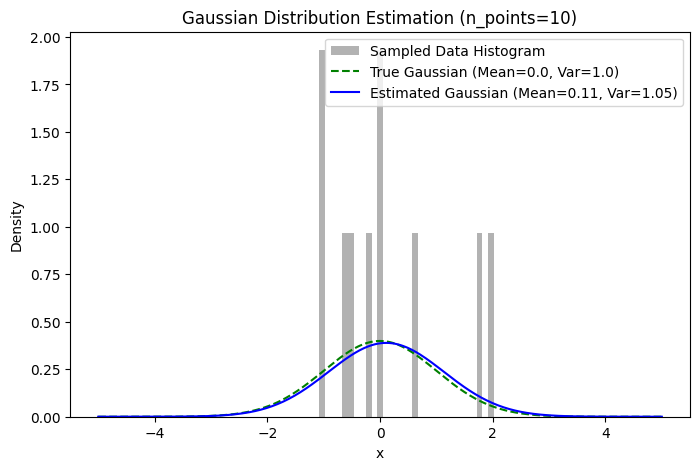

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

# Function to generate Gaussian-distributed data
def get_data(n_points=100):
    true_mean = 0.0
    true_variance = 1.0
    data = np.random.normal(true_mean, np.sqrt(true_variance), n_points)  # Generate normal distributed data
    return data, (true_mean, true_variance)

# Function to estimate mean and variance
def estimated_function(data):
    estimated_mean = np.mean(data)
    estimated_variance = np.var(data)
    return estimated_mean, estimated_variance

# Unified function to handle both slider-based and static plotting
def plot_estimation(n_points=100, slider=False, estimated_function=None):
    if slider:
        slider_widget = widgets.IntSlider(value=n_points, min=10, max=50000, step=50, description="n_points")
        return widgets.interactive(lambda n: plot_estimation(n, slider=False, estimated_function=estimated_function), 
                                   n=slider_widget)
    
    if estimated_function is None:
        raise ValueError("You must provide an estimated_function to fit the data.")

    data, (true_mean, true_variance) = get_data(n_points)
    estimated_mean, estimated_variance = estimated_function(data)

    x = np.linspace(-5, 5, 400)

    def gaussian(x, mean, variance):
        return (1 / np.sqrt(2 * np.pi * variance)) * np.exp(- (x - mean) ** 2 / (2 * variance))
    
    y_true = gaussian(x, true_mean, true_variance)
    y_estimated = gaussian(x, estimated_mean, estimated_variance)

    plt.figure(figsize=(8,5))
    plt.hist(data, bins=30, density=True, alpha=0.6, color='gray', label="Sampled Data Histogram")
    plt.plot(x, y_true, 'g--', label=f"True Gaussian (Mean={true_mean}, Var={true_variance})")
    plt.plot(x, y_estimated, 'b-', label=f"Estimated Gaussian (Mean={estimated_mean:.2f}, Var={estimated_variance:.2f})")
    plt.xlabel("x")
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Gaussian Distribution Estimation (n_points={n_points})")
    plt.show()

plot_estimation(n_points=10, slider=True, estimated_function=estimated_function)

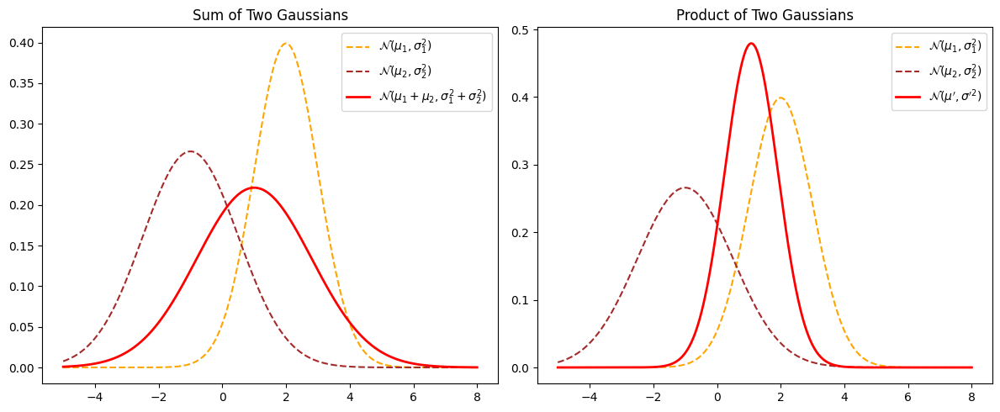

In [56]:
# Define parameters for two Gaussian distributions
mu1, sigma1 = 2, 1
mu2, sigma2 = -1, 1.5

# Define the range for plotting
x = np.linspace(-5, 8, 500)

# Compute the PDFs of the two Gaussians
pdf1 = norm.pdf(x, mu1, sigma1)
pdf2 = norm.pdf(x, mu2, sigma2)

# Sum of two independent Gaussians
mu_sum = mu1 + mu2
sigma_sum = np.sqrt(sigma1**2 + sigma2**2)
pdf_sum = norm.pdf(x, mu_sum, sigma_sum)

# Product of two Gaussians (up to a normalization constant)
sigma_prod = np.sqrt((sigma1**2 * sigma2**2) / (sigma1**2 + sigma2**2))
mu_prod = (mu1 * sigma2**2 + mu2 * sigma1**2) / (sigma1**2 + sigma2**2)
pdf_prod = norm.pdf(x, mu_prod, sigma_prod)

# Plot the Gaussians
plt.figure(figsize=(12, 5))

# Subplot for Sum of Gaussians
plt.subplot(1, 2, 1)
plt.plot(x, pdf1, label=r'$\mathcal{N}(\mu_1, \sigma_1^2)$', linestyle='dashed', color='orange')
plt.plot(x, pdf2, label=r'$\mathcal{N}(\mu_2, \sigma_2^2)$', linestyle='dashed', color='brown')
plt.plot(x, pdf_sum, label=r'$\mathcal{N}(\mu_1+\mu_2, \sigma_1^2+\sigma_2^2)$', linewidth=2, color='red')
plt.title('Sum of Two Gaussians')
plt.legend()

# Subplot for Product of Gaussians
plt.subplot(1, 2, 2)
plt.plot(x, pdf1, label=r'$\mathcal{N}(\mu_1, \sigma_1^2)$', linestyle='dashed', color='orange')
plt.plot(x, pdf2, label=r'$\mathcal{N}(\mu_2, \sigma_2^2)$', linestyle='dashed', color='brown')
plt.plot(x, pdf_prod, label=r'$\mathcal{N}(\mu^\prime, \sigma^{\prime 2})$', linewidth=2, color='red')
plt.title('Product of Two Gaussians')
plt.legend()

plt.tight_layout()
plt.show()

## Forward Diffusion

The **forward process** (or **noising process**) in diffusion models gradually adds Gaussian noise to a data sample $ x_0 $ over a series of timesteps, producing a latent variable \( x_t \) at each step. The process follows a **Markovian structure**, meaning each step depends only on the previous step.

## Forward Diffusion Process

The forward process is defined as a sequence of conditional distributions:

$$
q(x_t \mid x_{t-1}) = \mathcal{N}(x_t; \sqrt{1 - \beta_t} x_{t-1}, \beta_t I)
$$

where:
- $ x_0 $ is the original data sample.
- $ \beta_t $ is the **variance schedule**, controlling the noise at step $ t $.
- $ I $ is the identity matrix, ensuring isotropic Gaussian noise.

Applying this recursively from $ x_0 $ to $ x_T $, the **marginal distribution** at any time step $ t $ is:

$$
q(x_t \mid x_0) = \mathcal{N}(x_t; \sqrt{\bar{\alpha}_t} x_0, (1 - \bar{\alpha}_t) I)
$$

where:

$$
\bar{\alpha}_t = \prod_{s=1}^{t} (1 - \beta_s)
$$

## Sampling from the Forward Process

A key property of the forward process is that we can sample $ x_t $ directly from $ x_0 $ using:

$$
x_t = \sqrt{\bar{\alpha}_t} x_0 + \sqrt{1 - \bar{\alpha}_t} \epsilon, \quad \text{where} \quad \epsilon \sim \mathcal{N}(0, I)
$$

This allows efficient sampling without iterating through every step of the Markov chain.

## Key Properties

1. **Noise Accumulation**: The forward process gradually converts $ x_0 $ into pure Gaussian noise.
2. **Gaussian Structure**: The transition at each step remains Gaussian, making the entire process analytically tractable.
3. **Deterministic Mean**: The mean of $ q(x_t \mid x_0) $ depends only on $ x_0 $, allowing for closed-form sampling.

This forward process is the foundation of **denoising diffusion probabilistic models (DDPMs)**, enabling controlled generation through the reverse process.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.stats import gaussian_kde

# Set random seed for reproducibility
np.random.seed(42)

# Parameters
n_samples = 10000  # Number of data points
T = 200            # Number of diffusion steps
beta_start = 1e-4  # Starting noise level
beta_end = 0.1     # Ending noise level

# Generate initial non-Gaussian data (mixture of two Gaussians)
initial_data = np.concatenate([
    np.random.normal(loc=-4, scale=1.5, size=n_samples//2),
    np.random.normal(loc=4, scale=1.5, size=n_samples//2)
])

# Create noise schedule (linear)
beta = np.linspace(beta_start, beta_end, T)

# Forward diffusion process
diffusion_steps = [initial_data.copy()]
for t in range(T):
    x_prev = diffusion_steps[-1]
    noise = np.random.randn(n_samples)
    x_next = np.sqrt(1 - beta[t]) * x_prev + np.sqrt(beta[t]) * noise
    diffusion_steps.append(x_next)

# Precompute KDEs for smooth animation
x_grid = np.linspace(-10, 10, 500)
kde_values = []
max_kde = 0

print("Precomputing KDEs...")
for i, step in enumerate(diffusion_steps):
    kde = gaussian_kde(step)
    y = kde.evaluate(x_grid)
    kde_values.append(y)
    current_max = y.max()
    if current_max > max_kde:
        max_kde = current_max
    print(f"Processed step {i}/{len(diffusion_steps)-1}", end='\r')

# Set up figure
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_xlim(-10, 10)
ax.set_ylim(0, max_kde * 1.1)
ax.set_xlabel("Value")
ax.set_ylabel("Density")
ax.set_title("Forward Diffusion Process")

line, = ax.plot(x_grid, kde_values[0], lw=2, color='blue')
ax.grid(True)

# Add theoretical final Gaussian distribution
final_gaussian = np.exp(-0.5 * (x_grid)**2) / np.sqrt(2*np.pi)
ax.plot(x_grid, final_gaussian, '--', color='red', lw=2, label='Target Gaussian')
ax.legend()

# Animation function
def update(frame):
    line.set_ydata(kde_values[frame])
    ax.set_title(f"Forward Diffusion Process (Step {frame}/{T})")
    return line,

# Create animation
ani = FuncAnimation(
    fig, 
    update, 
    frames=len(diffusion_steps), 
    interval=50, 
    blit=True
)

plt.close()

# Display the animation
from IPython.display import HTML
HTML(ani.to_jshtml())

Precomputing KDEs...
